# **Project 1**, MIE1626 Winter 2024
**Data Science Methods and Statistical Learning [120 Marks]**

**Deadline: 2024-02-09 @ 21:00**

**Academic Integrity**

This is an individual project. Do not share your code with others, or post any parts of your work online. You can only submit code that is produced by you. If you use any online resource for developing parts of your code, you must explicitly acknowledge the source in a comment in your code. Students suspected of plagiarism on the project will be referred to the university for formal discipline according to the regulations.

**Please note that late submissions receive a penalty (or a mark of 0) as per syllabus.**

Please fill out the following:

• Full Name: seonghak lee 


• Student Number: 1010826714


• UTorID: leeseo68



**Three submission files are required per group:**

For submitting this project, three files must be submitted on Quercus by the project deadline:

1) The complete Jupyter file (in .ipynb format) (that completely compiles on Google colab without any errors independent of the computer used.)

2) A self-contained and complete pdf printout of the same Jupyter file with all the output printed as well as all the code, text cells, comments, and figures.

3) Appendix pdf file of all prompts and all responses for all interactions you have had regarding this project with any AI assistant tool (ChatGPT etc.). If you do not use any AI assistant tool at all, this appendix pdf file is not needed.

**Policy regarding the use of AI assistant tools**

If you use a generative AI tool (e.g., ChatGPT, GitHub Copilot, or any other similar tool) to get ideas and/or partial answers for projects or assignments or to generate any code and/or text, you must declare in your submission the tools that you have used and describe the usage, and include in your submission an appendix that captures all the interactions (prompts and responses).

You will not be penalized for the declared use of such AI assistant tools, and the grading decisions will be based on your original contributions as well as the efforts that you make to check and/or correct the answers provided by the tool. Students are ultimately accountable for the work they submit. Failure to fully declare the use of this tool will be considered "unauthorized assistance" and will have consequences (See B.I. of the [U of T CODE OF BEHAVIOUR ON ACADEMIC MATTERS](https://governingcouncil.utoronto.ca/secretariat/policies/code-behaviour-academic-matters-july-1-2019))

## **Part 0: Loading the libraries and the data [0 Marks]**


In this project, we want to develop a statistical model for the mortality rate of lung cancer in the United States.

One of the parts overlooked in many data science projects is preprocessing. And a good way to learn it is by solving a lot of examples and test cases. A big part of this project is walking you through preprocessing, making informed decisions using your observations, and exploratory data analysis. Then we use supervised learning methods to construct models to predict the mortality rate of lung cancer using the features provided here.

In [938]:
# data wrangling tools
import pandas as pd
import numpy as np

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

# statistical learning
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan



## Loading data
Load the three csv files as pandas dataframes directly from their URLs.

In [939]:
fulldf = pd.read_csv('https://saref.github.io/teaching/MIE1626/mydata.csv').drop(columns='Unnamed: 0')
data_dict = pd.read_csv('https://saref.github.io/teaching/MIE1626/descriptions.csv')
populationdf = pd.read_csv('https://saref.github.io/teaching/MIE1626/populations2022.csv').drop(columns='Unnamed: 0')


Data set `mydata.csv` includes most of the data. Explanations on the meaning of each of the columns are included in `descriptions.csv`. Please take your time to understand the three dataframes before proceeding.

In [940]:
print('fulldf shape : {}, data_dict shape : {}, populationdf shape : {}'.format(fulldf.shape, data_dict.shape, populationdf.shape))

fulldf shape : (3134, 23), data_dict shape : (23, 4), populationdf shape : (3275, 3)


In [941]:
fulldf

,State,AreaName,All_Poverty,M_Poverty,F_Poverty,FIPS,Med_Income,Med_Income_White,Med_Income_Black,Med_Income_Nat_Am,...,M_Without,F_With,F_Without,All_With,All_Without,Incidence_Rate,Avg_Ann_Incidence,Recent_Trend,Mortality_Rate,Avg_Ann_Deaths
0,AK,"Aleutians East Borough, Alaska",553,334,219,2013,61518.0,72639.0,31250.0,54750.0,...,1317,566,540,1442,1857,*,3 or fewer,*,*,*
1,AK,"Aleutians West Census Area, Alaska",499,273,226,2016,84306.0,97321.0,93750.0,48750.0,...,769,1707,564,4177,1333,*,3 or fewer,*,*,*
2,AK,"Anchorage Municipality, Alaska",23914,10698,13216,2020,78326.0,87235.0,50535.0,53935.0,...,23245,122426,21393,243173,44638,61.5,131,stable,47.3,96
3,AK,"Bethel Census Area, Alaska",4364,2199,2165,2050,51012.0,92647.0,73661.0,41594.0,...,2708,6627,1774,13023,4482,62.7,6,stable,58.3,5
4,AK,"Bristol Bay Borough, Alaska",69,33,36,2060,79750.0,88000.0,NaN,63333.0,...,124,349,67,768,191,*,3 or fewer,*,*,*
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3129,WY,"Sweetwater County, Wyoming",5058,2177,2881,56037,69022.0,69333.0,23535.0,NaN,...,3318,18600,2683,38491,6001,39.9,14,stable,28.4,9
3130,WY,"Teton County, Wyoming",1638,1026,612,56039,75325.0,77651.0,NaN,NaN,...,2558,9555,1192,18503,3750,23.7,5,stable,29.1,5
3131,WY,"Uinta County, Wyoming",2845,1453,1392,56041,56569.0,56532.0,NaN,NaN,...,1413,8711,1503,17843,2916,31.7,6,stable,22.1,4
3132,WY,"Washakie County, Wyoming",1137,489,648,56043,47652.0,48110.0,NaN,NaN,...,691,3490,703,6839,1394,50,6,stable,38.2,5


In [942]:
data_dict

,Unnamed: 0,Feature,Definition,Notes
0,0,State,NaN,NaN
1,1,AreaName,NaN,NaN
2,2,All_Poverty,Both male and female reported below poverty li...,NaN
3,3,M_Poverty,Males below poverty (Raw),NaN
4,4,F_Poverty,Females below poverty (Raw),NaN
5,5,FIPS,State + County FIPS (Raw),NaN
6,6,Med_Income,Med_Income all enthnicities (Raw),NaN
7,7,Med_Income_White,Med_Income white (Raw),NaN
8,8,Med_Income_Black,Med_Income black (Raw),NaN
9,9,Med_Income_Nat_Am,Med_Income native American (Raw),NaN


In [943]:
populationdf


,POP_ESTIMATE_2022,State,County
0,333287557,0,0
1,5074296,1,0
2,59759,1,1
3,246435,1,3
4,24706,1,5
...,...,...,...
3270,53684,72,145
3271,8043,72,147
3272,21466,72,149
3273,29305,72,151


## **Part 1: Getting started [40 Marks]**

## Data cleaning
In this project, we go through specific data cleaning steps. Please read through the instructions carefully.


### 1.1 Convert `FIPS` column to correct format [5 Marks]
Federal Information Processing Standard or [FIPS](https://en.wikipedia.org/wiki/FIPS_county_code) is a categorical variable. It is a code with five digits. The left two digits showing the state and the three right digits showing the county code. We recognize that desipite being a number, FIPS is actually a categorical variable.
First, check the format of the `FIPS` column and convert them to the five digit format with type `np.object_` as seen in the county level section, [here](https://transition.fcc.gov/oet/info/maps/census/fips/fips.txt#:~:text=county%2Dlevel%20%20%20%20%20%20place).

*Hint*: You can use [apply](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) to first convert the type and then use [`str.pad`](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.pad.html) to format the values as five digit numbers.

In [944]:
print(fulldf['FIPS'])

print(np.object_(fulldf['FIPS']))
FIPS = fulldf['FIPS'].apply(str)
print(np.object_(FIPS))

FIPS = FIPS.str.pad(width=5, fillchar='0', side='left')
fulldf.FIPS = FIPS
print(FIPS)


0        2013
1        2016
2        2020
3        2050
4        2060
        ...  
3129    56037
3130    56039
3131    56041
3132    56043
3133    56045
Name: FIPS, Length: 3134, dtype: int64
[2013 2016 2020 ... 56041 56043 56045]
['2013' '2016' '2020' ... '56041' '56043' '56045']
0       02013
1       02016
2       02020
3       02050
4       02060
        ...  
3129    56037
3130    56039
3131    56041
3132    56043
3133    56045
Name: FIPS, Length: 3134, dtype: object


### 1.2 Check for null values [5 Marks]

Just check for null values and remove columns whenever the percentage of null values is greater than 20. Please briefly justify your choices w.r.t. the columns you have removed.

In [945]:
'''
Among all columns, the columns with a null value ratio of more than 20% were 'Med_Income_Black', 'Med_Income_Nat_Am', 'Med_Income_Asian', and 'Med_Income_Hispanic', 
so they were removed, and these 4 out of 23 columns were removed, reducing the total to 19 columns.
'''
total_count = fulldf[fulldf.columns].shape[0]
null_count = fulldf.isnull().sum()
print(null_count/total_count * 100)

dropped_name = fulldf.columns[(null_count/total_count*100) > 20]
fulldf = fulldf.drop(dropped_name, axis=1)

print("dropped columns name : {} ".format(dropped_name.values))
print("fulldf shape : {}".format(fulldf.shape))

State                   0.000000
AreaName                0.000000
All_Poverty             0.000000
M_Poverty               0.000000
F_Poverty               0.000000
FIPS                    0.000000
Med_Income              0.031908
Med_Income_White        0.063816
Med_Income_Black       38.608807
Med_Income_Nat_Am      52.967454
Med_Income_Asian       56.062540
Med_Income_Hispanic    21.729419
M_With                  0.000000
M_Without               0.000000
F_With                  0.000000
F_Without               0.000000
All_With                0.000000
All_Without             0.000000
Incidence_Rate          0.000000
Avg_Ann_Incidence       0.000000
Recent_Trend            0.000000
Mortality_Rate          0.000000
Avg_Ann_Deaths          0.000000
dtype: float64
dropped columns name : ['Med_Income_Black' 'Med_Income_Nat_Am' 'Med_Income_Asian'
 'Med_Income_Hispanic'] 
fulldf shape : (3134, 19)


### 1.3 Check the format of columns [5 Marks]
Report the format of each column. List the columns that are in an unexpected format and state why you think that is the case.

*Hint*: You can do this by either inspecting the dataframe or by writing a code snippet that tells you what cells cannot be reformatted to the correct format. The Titanic example (Python Lab 1) in MIE1626 YouTube playlist may also give you some useful ideas.

In [946]:
for col in fulldf.columns:
    print("col name : {:15} \t data type : {}".format(col,fulldf[col].dtype))

col name : State           	 data type : object
col name : AreaName        	 data type : object
col name : All_Poverty     	 data type : int64
col name : M_Poverty       	 data type : int64
col name : F_Poverty       	 data type : int64
col name : FIPS            	 data type : object
col name : Med_Income      	 data type : float64
col name : Med_Income_White 	 data type : float64
col name : M_With          	 data type : int64
col name : M_Without       	 data type : int64
col name : F_With          	 data type : int64
col name : F_Without       	 data type : int64
col name : All_With        	 data type : int64
col name : All_Without     	 data type : int64
col name : Incidence_Rate  	 data type : object
col name : Avg_Ann_Incidence 	 data type : object
col name : Recent_Trend    	 data type : object
col name : Mortality_Rate  	 data type : object
col name : Avg_Ann_Deaths  	 data type : object


### 1.4 Merge the population data to the main dataframe [5 Marks]
You already know about FIPS. You can use the state and county columns in this dataset to construct a FIPS column in the population dataframe in the same format as the main dataframe. Then merge the population data to the main dataframe. It is up to you to decide the type of merge and whether it is done properly.

In [947]:
'''
I merged the data based on the "fulldf." 
I merged the "POP_ESTIMATE_2022" using "fulldf FIPS" as the key, 
so only the "POP_ESTIMATE_2022" values corresponding to the FIPS in the "fulldf" were included in the merge.
'''

# check before shape
before_shape = fulldf.shape

# add FIPS column to populationdf
state = populationdf.State.apply(str).str.pad(width=2, fillchar='0', side='left')
county = populationdf.County.apply(str).str.pad(width=3, fillchar='0', side='left')
populationdf["FIPS"] = state + county
populationdf = populationdf.drop(columns=['State', 'County'], axis=1)

# merge fulldf and populationdf
fulldf = fulldf.merge(populationdf, left_on='FIPS', right_on="FIPS", how='inner')

# check after shape
after_shape = fulldf.shape

In [948]:
for i in range(len(fulldf)):
    print('FIPS : {}, POP_ESTIMATE_2022 : {}'.format(fulldf.FIPS[i], fulldf.POP_ESTIMATE_2022[i]))

FIPS : 02013, POP_ESTIMATE_2022 : 3398
FIPS : 02016, POP_ESTIMATE_2022 : 5122
FIPS : 02020, POP_ESTIMATE_2022 : 287145
FIPS : 02050, POP_ESTIMATE_2022 : 18257
FIPS : 02060, POP_ESTIMATE_2022 : 865
FIPS : 02068, POP_ESTIMATE_2022 : 1585
FIPS : 02070, POP_ESTIMATE_2022 : 4723
FIPS : 02090, POP_ESTIMATE_2022 : 95356
FIPS : 02100, POP_ESTIMATE_2022 : 2056
FIPS : 02110, POP_ESTIMATE_2022 : 31685
FIPS : 02122, POP_ESTIMATE_2022 : 60690
FIPS : 02130, POP_ESTIMATE_2022 : 13741
FIPS : 02150, POP_ESTIMATE_2022 : 12720
FIPS : 02164, POP_ESTIMATE_2022 : 1381
FIPS : 02170, POP_ESTIMATE_2022 : 113325
FIPS : 02180, POP_ESTIMATE_2022 : 9835
FIPS : 02185, POP_ESTIMATE_2022 : 10805
FIPS : 02188, POP_ESTIMATE_2022 : 7423
FIPS : 02220, POP_ESTIMATE_2022 : 8382
FIPS : 02240, POP_ESTIMATE_2022 : 7021
FIPS : 02282, POP_ESTIMATE_2022 : 700
FIPS : 02290, POP_ESTIMATE_2022 : 5179
FIPS : 01001, POP_ESTIMATE_2022 : 59759
FIPS : 01003, POP_ESTIMATE_2022 : 246435
FIPS : 01005, POP_ESTIMATE_2022 : 24706
FIPS : 01007

In [949]:
# compare before shape with after shape
print('before shape : {} \nafter shape : {}'.format(before_shape, after_shape))

before shape : (3134, 19) 
after shape : (3125, 20)


### 1.5 Cleaning the output (response) column `Mortality_Rate` [10 Marks]
Using the file `descriptions.csv`, explain what the non-numerical values of `Mortality_Rate` mean.

Then, it is decision making time, we have to decide whether to remove the non-numerical values from `Mortality_Rate` or to assign a specific numerical value to them. This decision is based on you inferring if the non-numerical values were caused by error in data gathering or not.

Note that if the observations are valid and are deleted, we are adding a bias to the model.

*Hint*: To get the full mark for this part, conduct multiple relevant exploratory data analyses. Then use them to support your decision on removing or modifying the non-numerical values. Your choice results in full mark if the supporting analysis and arguments are deemed adequate and convincing.

In [950]:
'''
'*' = fewer that 16 reported cases 
 
When you check the column marked '*' in Mortality_Rate, 
we can see that the values of other columns are also often missing.
Additionally, the missing value is not large at 10.4%. 
Based on these two reasons, i think it is right to delete it.
'''

"\n'*' = fewer that 16 reported cases \n \nWhen you check the column marked '*' in Mortality_Rate, \nwe can see that the values of other columns are also often missing.\nAdditionally, the missing value is not large at 10.4%. \nBased on these two reasons, i think it is right to delete it.\n"

In [951]:
for i in range(len(data_dict)):
    print('feature : {:20}, description : {:<60}, notes : {}'.format(data_dict.Feature[i], data_dict.Definition[i], data_dict.Notes[i]))


feature : State               , description : nan                                                         , notes : nan
feature : AreaName            , description : nan                                                         , notes : nan
feature : All_Poverty         , description : Both male and female reported below poverty line (Raw)      , notes : nan
feature : M_Poverty           , description : Males below poverty (Raw)                                   , notes : nan
feature : F_Poverty           , description : Females below poverty (Raw)                                 , notes : nan
feature : FIPS                , description : State + County FIPS (Raw)                                   , notes : nan
feature : Med_Income          , description : Med_Income all enthnicities (Raw)                           , notes : nan
feature : Med_Income_White    , description : Med_Income white (Raw)                                      , notes : nan
feature : Med_Income_Black    , descript

In [952]:
nan_value_in_Mortality_Rate = fulldf['Mortality_Rate'].isin(['*']).sum()
total_count = len(fulldf['Mortality_Rate'])
print('nan value in Mortality_Rate : {}\ntotal_count : {}\nrate of star : {}'.format(nan_value_in_Mortality_Rate, total_count, nan_value_in_Mortality_Rate/total_count*100))


nan value in Mortality_Rate : 325
total_count : 3125
rate of star : 10.4


In [953]:
index_of_nan_value_in_Mortality_Rate = fulldf[fulldf['Mortality_Rate'].isin(['*'])]
for i in index_of_nan_value_in_Mortality_Rate.index:
    print('Mortality_Rate : {:1}, Incidence_Rate : {:5}, Recent_Trend : {:7}, Avg_Ann_Deaths : {:5}'
          .format(fulldf['Mortality_Rate'][i], fulldf['Incidence_Rate'][i], 
                  fulldf['Recent_Trend'][i], fulldf['Avg_Ann_Deaths'][i]))


Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : 67.6 , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : 76.8 , Recent_Trend : stable , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : *    , Recent_Trend : *      , Avg_Ann_Deaths : *    
Mortality_Rate : *, Incidence_Rate : 58.3 , Recent_Trend : *      , Avg_Ann_Deaths : *    

In [954]:
fulldf = fulldf.drop(index=index_of_nan_value_in_Mortality_Rate.index)

In [955]:
fulldf

,State,AreaName,All_Poverty,M_Poverty,F_Poverty,FIPS,Med_Income,Med_Income_White,M_With,M_Without,F_With,F_Without,All_With,All_Without,Incidence_Rate,Avg_Ann_Incidence,Recent_Trend,Mortality_Rate,Avg_Ann_Deaths,POP_ESTIMATE_2022
2,AK,"Anchorage Municipality, Alaska",23914,10698,13216,02020,78326.0,87235.0,120747,23245,122426,21393,243173,44638,61.5,131,stable,47.3,96,287145
3,AK,"Bethel Census Area, Alaska",4364,2199,2165,02050,51012.0,92647.0,6396,2708,6627,1774,13023,4482,62.7,6,stable,58.3,5,18257
7,AK,"Fairbanks North Star Borough, Alaska",7752,3523,4229,02090,71068.0,74242.0,40605,6957,40210,5322,80815,12279,58.1,36,stable,54,31,95356
9,AK,"Juneau City and Borough, Alaska",2110,1145,965,02110,85746.0,90553.0,13739,2433,13582,2213,27321,4646,35.1,9,stable,34.4,8,31685
10,AK,"Kenai Peninsula Borough, Alaska",5558,2596,2962,02122,63684.0,64663.0,22391,6435,21668,5433,44059,11868,64.9,39,stable,50.1,28,60690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3120,WY,"Sweetwater County, Wyoming",5058,2177,2881,56037,69022.0,69333.0,19891,3318,18600,2683,38491,6001,39.9,14,stable,28.4,9,41345
3121,WY,"Teton County, Wyoming",1638,1026,612,56039,75325.0,77651.0,8948,2558,9555,1192,18503,3750,23.7,5,stable,29.1,5,23287
3122,WY,"Uinta County, Wyoming",2845,1453,1392,56041,56569.0,56532.0,9132,1413,8711,1503,17843,2916,31.7,6,stable,22.1,4,20712
3123,WY,"Washakie County, Wyoming",1137,489,648,56043,47652.0,48110.0,3349,691,3490,703,6839,1394,50,6,stable,38.2,5,7719


### 1.6 Reformat the rest of the columns specified in 1.3 to numerical [5 Marks]
In each column reformat all the cells that you can.

*Hint*: You can keep the cells that you cannot reformat until you decide if you want to use the specific column in the model. This is because you want to lose as least data as possible. So you can drop the associated rows if you want to use the column and keep them if the specific column is not used.

In [956]:
'''
col name : Incidence_Rate  	 data type : object
col name : Avg_Ann_Incidence 	 data type : object
col name : Mortality_Rate  	 data type : object
col name : Avg_Ann_Deaths  	 data type : object
We need to replace these 4 formats with numeric formats.
'''

for col in fulldf.columns:
    print("col name : {:15} \t data type : {}".format(col,fulldf[col].dtype))

col name : State           	 data type : object
col name : AreaName        	 data type : object
col name : All_Poverty     	 data type : int64
col name : M_Poverty       	 data type : int64
col name : F_Poverty       	 data type : int64
col name : FIPS            	 data type : object
col name : Med_Income      	 data type : float64
col name : Med_Income_White 	 data type : float64
col name : M_With          	 data type : int64
col name : M_Without       	 data type : int64
col name : F_With          	 data type : int64
col name : F_Without       	 data type : int64
col name : All_With        	 data type : int64
col name : All_Without     	 data type : int64
col name : Incidence_Rate  	 data type : object
col name : Avg_Ann_Incidence 	 data type : object
col name : Recent_Trend    	 data type : object
col name : Mortality_Rate  	 data type : object
col name : Avg_Ann_Deaths  	 data type : object
col name : POP_ESTIMATE_2022 	 data type : int64


In [957]:
# convert object type('x,xxx') to int type(xxxx) in Avg_ann_Deaths 
index = fulldf[fulldf['Avg_Ann_Deaths'].str.isnumeric() == False].index
print('index needed to convert to numerical value : {} '.format(index.values))
for i in index:
    if isinstance(fulldf['Avg_Ann_Deaths'][i], str):
        fulldf.at[i, 'Avg_Ann_Deaths'] = int(fulldf['Avg_Ann_Deaths'][i].replace(",", ""))

fulldf['Avg_Ann_Deaths'] = fulldf['Avg_Ann_Deaths'].astype('float64')

index needed to convert to numerical value : [ 171  197  215  694 1297 2607] 


In [958]:
# convert  to int type in Mortality_Rate 
fulldf['Mortality_Rate'] = fulldf['Mortality_Rate'].astype('float64')

In [959]:
'''
There are about 6.0% missing values ​​in Avg_Ann_Incidence.
Since the ratio is not large, i decided to delete it.
'''
# convert object type to int type in Avg_Ann_Incidence 
index = fulldf[fulldf['Avg_Ann_Incidence'].str.isnumeric() == False].index
print('index length  : {}'.format(len(index)))
print('nan ratio : {}'.format((len(index)/len(fulldf)*100).__round__(2)))
print('before num of row : {}'.format(len(fulldf)))
fulldf = fulldf.drop(index=index)
print('after num of row : {}'.format(len(fulldf)))

fulldf['Avg_Ann_Incidence'] = fulldf['Avg_Ann_Incidence'].astype(float)

index length  : 168
nan ratio : 6.0
before num of row : 2800
after num of row : 2632


In [960]:
'''
There are about 3.0% missing values ​​in Incidence_Rate
Since the ratio is not large, i decided to delete it.
'''
# convert object type to int type in Incidence_Rate 

index = fulldf[~fulldf['Incidence_Rate'].apply(lambda x: str(x).replace('.', '').isdigit())].index
fulldf['Incidence_Rate'] = fulldf['Incidence_Rate'].str.replace('#', '')

print('index length : {}'.format(len(index)))
print('nan ratio : {}'.format((len(index)/len(fulldf)*100).__round__(2)))

fulldf['Incidence_Rate'] = fulldf['Incidence_Rate'].astype(float)

index length : 79
nan ratio : 3.0


In [961]:
fulldf['Avg_Ann_Deaths'] = fulldf['Avg_Ann_Deaths'].astype(float)
for col in fulldf.columns:
    print("col name : {:15} \t data type : {}".format(col,fulldf[col].dtype))

col name : State           	 data type : object
col name : AreaName        	 data type : object
col name : All_Poverty     	 data type : int64
col name : M_Poverty       	 data type : int64
col name : F_Poverty       	 data type : int64
col name : FIPS            	 data type : object
col name : Med_Income      	 data type : float64
col name : Med_Income_White 	 data type : float64
col name : M_With          	 data type : int64
col name : M_Without       	 data type : int64
col name : F_With          	 data type : int64
col name : F_Without       	 data type : int64
col name : All_With        	 data type : int64
col name : All_Without     	 data type : int64
col name : Incidence_Rate  	 data type : float64
col name : Avg_Ann_Incidence 	 data type : float64
col name : Recent_Trend    	 data type : object
col name : Mortality_Rate  	 data type : float64
col name : Avg_Ann_Deaths  	 data type : float64
col name : POP_ESTIMATE_2022 	 data type : int64


### 1.7 Make the numerical data useful [5 Marks]
We know we have many columns of data, some of them are dependent on the populations. As a *Hint*, convert all the raw data to per 100,000 persons rates (divide by population and multiply by 100,000).

In [962]:
'''
eature : All_Poverty         , description : Both male and female reported below poverty line (Raw)
feature : M_Poverty           , description : Males below poverty (Raw)                            
feature : F_Poverty           , description : Females below poverty (Raw)                
feature : FIPS                , description : State + County FIPS (Raw)             
feature : Med_Income          , description : Med_Income all enthnicities (Raw)           
feature : Med_Income_White    , description : Med_Income white (Raw)               
feature : M_With              , description : Males with health insurance (Raw)                
feature : M_Without           , description : Males without health insurance (Raw)           
feature : F_With              , description : Females with health insurance (Raw)              
feature : F_Without           , description : Females without health insurance (Raw)           
feature : All_With            , description : Males and Femaes with health ins. (Raw)           
feature : All_Without         , description : Males an Females without health ins (Raw)         
feature : Avg_Ann_Incidence   , description : Average lung cancer incidence rate (Raw)          
feature : Avg_Ann_Deaths      , description : Average lung cancer mortalities (Raw)       

raw 데이터가 아닌것들과 위에서 데이터 손실을 막기위해 전처리를 하지 않은 Incidence_Rate, Avg_Ann_Incidence를 제외하고 진행함.

I excluded data that was not raw data, Incidence_Rate and Avg_Ann_Incidence, 
which were not preprocessed above to prevent data loss.
'''

for col in fulldf.columns:
    if col not in  ['State', 'AreaName', 'FIPS', 'POP_ESTIMATE_2022','Incidence_Rate','Avg_Ann_Incidence', 'Recent_Trend', 'Mortality_Rate']:
        fulldf[col] = ((fulldf[col] / fulldf['POP_ESTIMATE_2022']) * 100000).round(2)
        


In [963]:
fulldf

,State,AreaName,All_Poverty,M_Poverty,F_Poverty,FIPS,Med_Income,Med_Income_White,M_With,M_Without,F_With,F_Without,All_With,All_Without,Incidence_Rate,Avg_Ann_Incidence,Recent_Trend,Mortality_Rate,Avg_Ann_Deaths,POP_ESTIMATE_2022
2,AK,"Anchorage Municipality, Alaska",8328.20,3725.64,4602.55,02020,27277.51,30380.12,42050.88,8095.21,42635.60,7450.24,84686.48,15545.46,61.5,131.0,stable,47.3,33.43,287145
3,AK,"Bethel Census Area, Alaska",23903.16,12044.70,11858.47,02050,279410.64,507460.15,35033.14,14832.67,36298.41,9716.82,71331.54,24549.49,62.7,6.0,stable,58.3,27.39,18257
7,AK,"Fairbanks North Star Borough, Alaska",8129.54,3694.58,4434.96,02090,74529.13,77857.71,42582.53,7295.82,42168.30,5581.19,84750.83,12877.01,58.1,36.0,stable,54.0,32.51,95356
9,AK,"Juneau City and Borough, Alaska",6659.30,3613.70,3045.61,02110,270620.17,285791.38,43361.21,7678.71,42865.71,6984.38,86226.92,14663.09,35.1,9.0,stable,34.4,25.25,31685
10,AK,"Kenai Peninsula Borough, Alaska",9158.02,4277.48,4880.54,02122,104933.27,106546.38,36894.05,10603.06,35702.75,8952.05,72596.80,19555.12,64.9,39.0,stable,50.1,46.14,60690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3120,WY,"Sweetwater County, Wyoming",12233.64,5265.45,6968.19,56037,166941.59,167693.80,48109.81,8025.15,44987.30,6489.30,93097.11,14514.45,39.9,14.0,stable,28.4,21.77,41345
3121,WY,"Teton County, Wyoming",7033.97,4405.89,2628.08,56039,323463.74,333452.14,38424.87,10984.67,41031.48,5118.74,79456.35,16103.41,23.7,5.0,stable,29.1,21.47,23287
3122,WY,"Uinta County, Wyoming",13736.00,7015.26,6720.74,56041,273121.86,272943.22,44090.38,6822.13,42057.74,7256.66,86148.13,14078.79,31.7,6.0,stable,22.1,19.31,20712
3123,WY,"Washakie County, Wyoming",14729.89,6335.02,8394.87,56043,617333.85,623267.26,43386.45,8951.94,45213.11,9107.40,88599.56,18059.33,50.0,6.0,stable,38.2,64.78,7719


## **Part 2: Exploratory analysis [15 Marks]**

### 2.1 Visualizing different features [5 Marks]
Here, show different feature and how they change with respect to each other.
*Hint*: A good function to use here is `sns.pairplot`. Remember to have the plots labeled properly so that they are self explanatory.


In [964]:
print(fulldf.columns.values)

['State' 'AreaName' 'All_Poverty' 'M_Poverty' 'F_Poverty' 'FIPS'
 'Med_Income' 'Med_Income_White' 'M_With' 'M_Without' 'F_With' 'F_Without'
 'All_With' 'All_Without' 'Incidence_Rate' 'Avg_Ann_Incidence'
 'Recent_Trend' 'Mortality_Rate' 'Avg_Ann_Deaths' 'POP_ESTIMATE_2022']


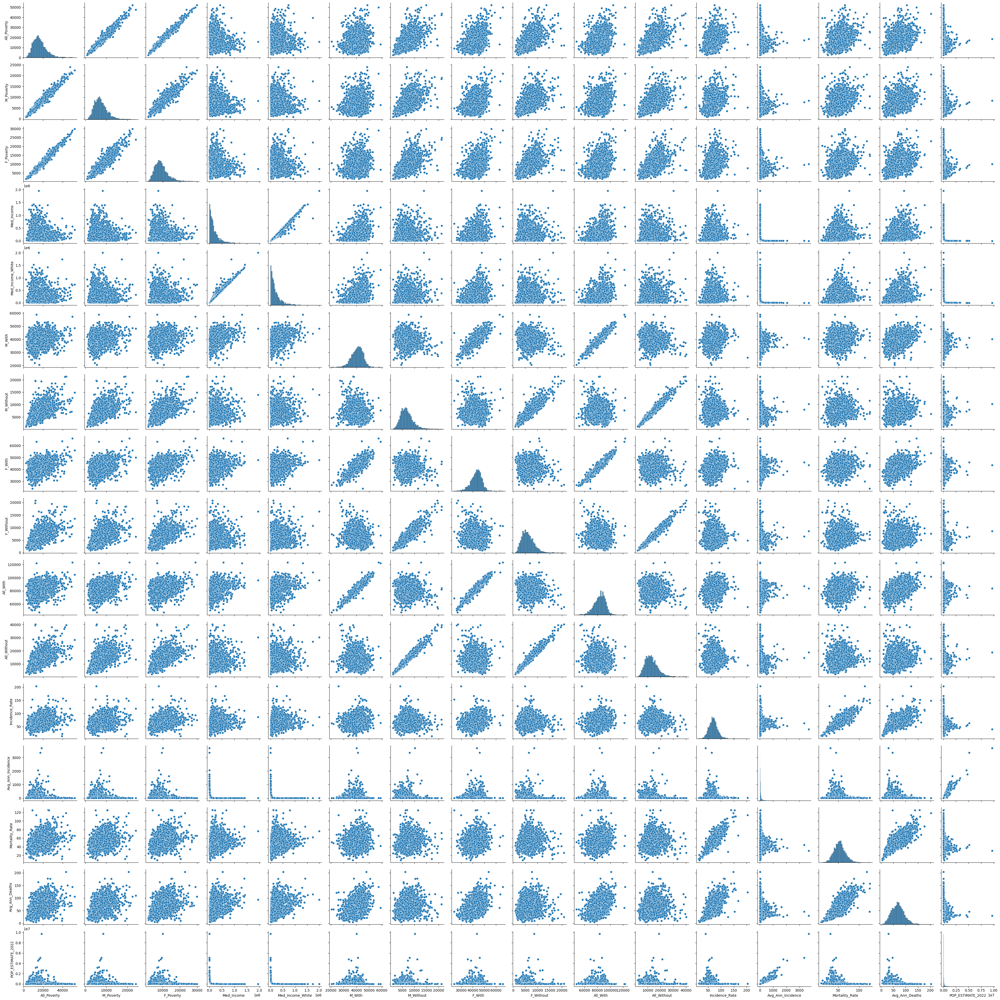

In [965]:
sns.pairplot(fulldf)

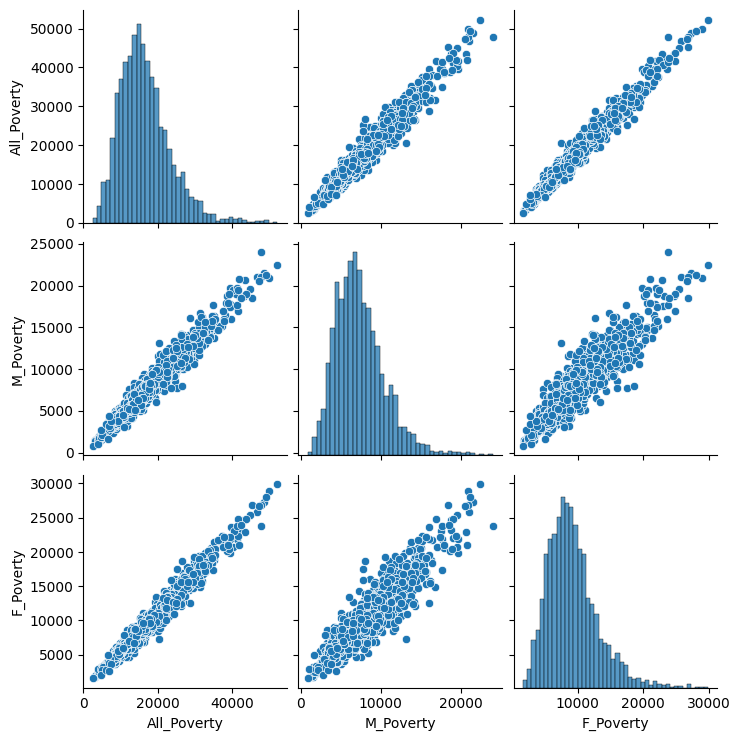

In [966]:
poverty = fulldf[['All_Poverty', 'M_Poverty', 'F_Poverty']]
sns.pairplot(poverty)

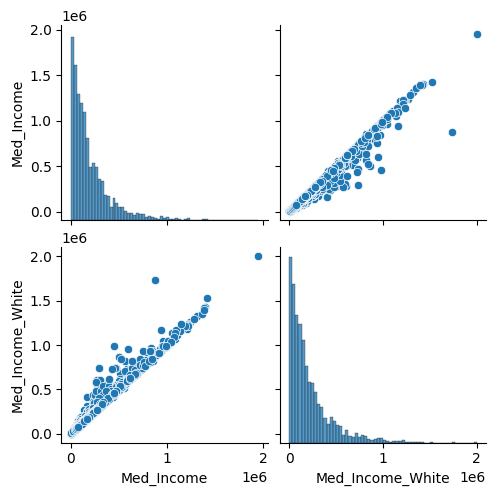

In [967]:
income = fulldf[['Med_Income', 'Med_Income_White']]
sns.pairplot(income)

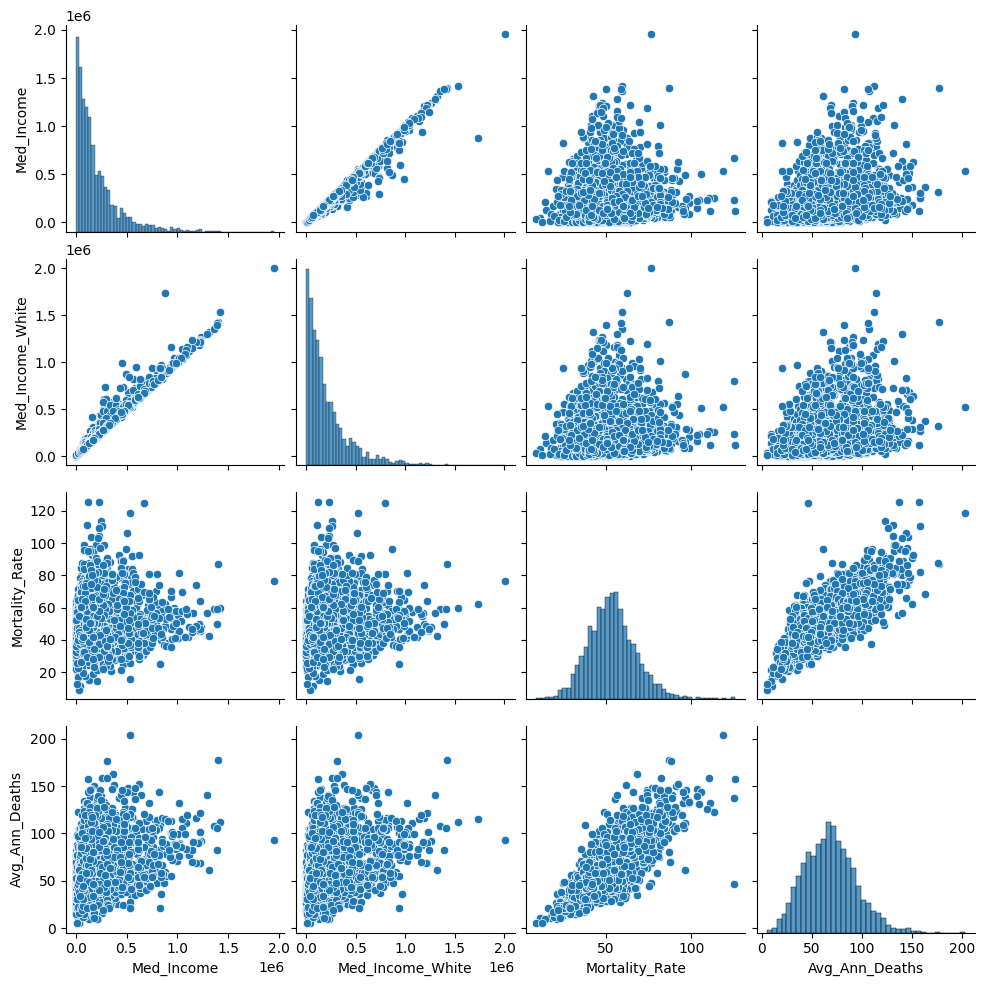

In [968]:
income_with_death = fulldf[['Med_Income', 'Med_Income_White', 'Mortality_Rate','Avg_Ann_Deaths']]
sns.pairplot(income_with_death)

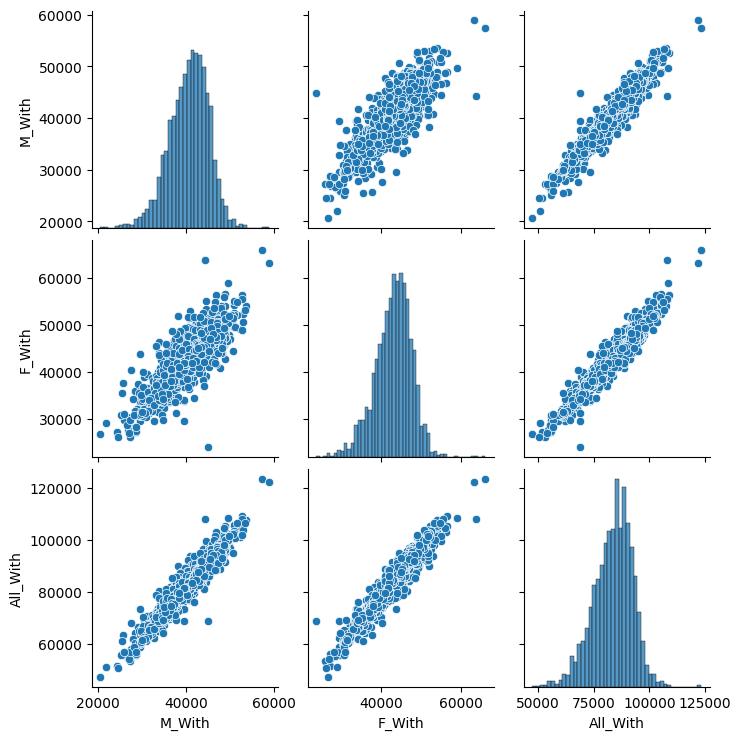

In [969]:
with_health_insurance  = fulldf[['M_With', 'F_With', 'All_With']]
sns.pairplot(with_health_insurance)

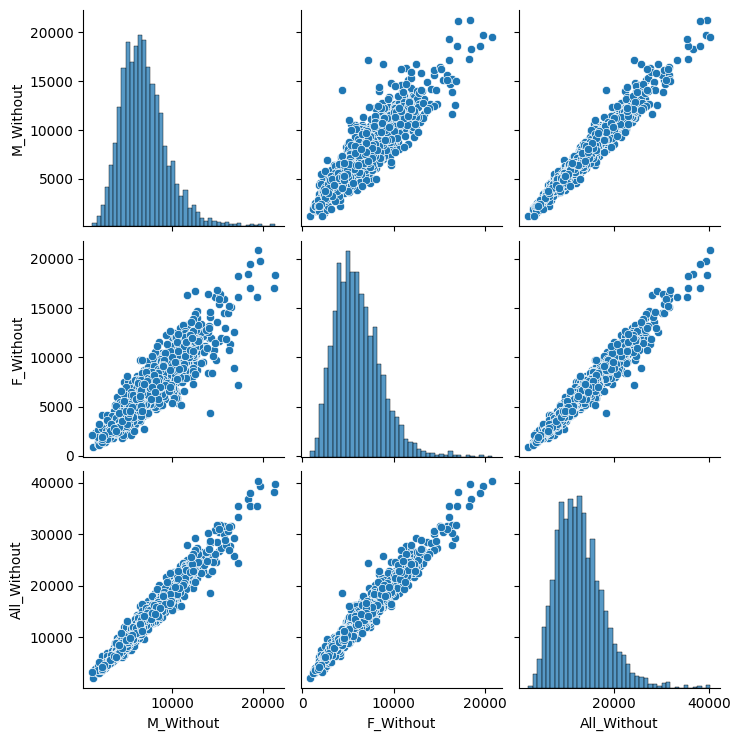

In [970]:
without_health_insurance  = fulldf[['M_Without', 'F_Without', 'All_Without']]
sns.pairplot(without_health_insurance)

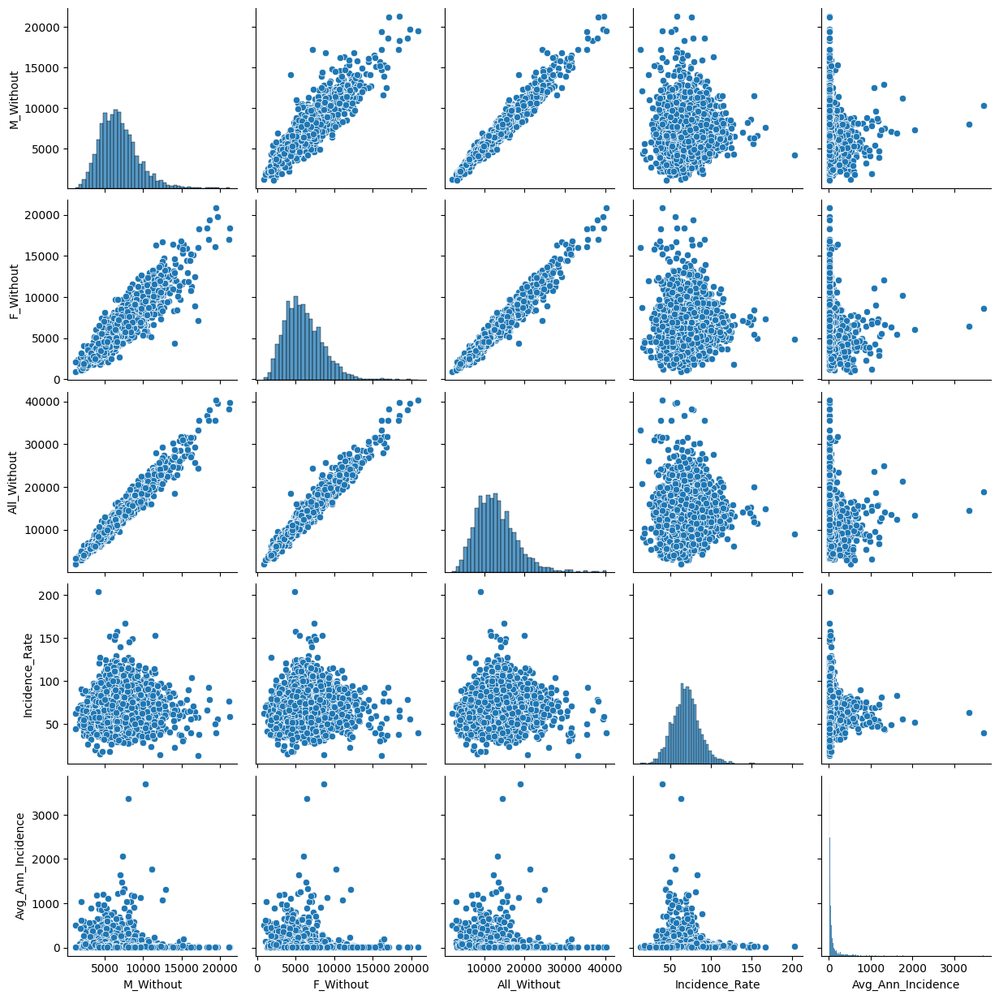

In [971]:
without_health_insurance_with_Mortality  = fulldf[['M_Without', 'F_Without', 'All_Without', 'Incidence_Rate', 'Avg_Ann_Incidence']]
sns.pairplot(without_health_insurance_with_Mortality)

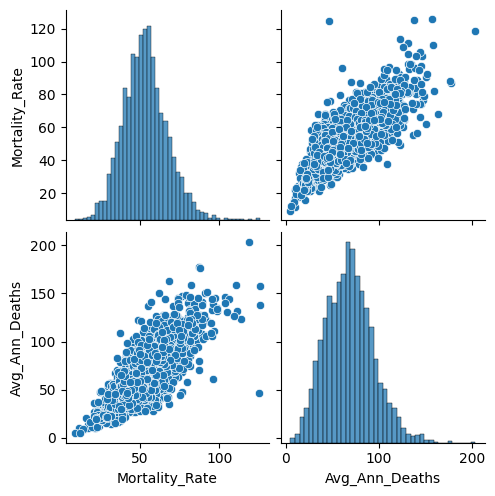

In [972]:
Mortality_with_death  = fulldf[['Mortality_Rate','Avg_Ann_Deaths']]
sns.pairplot(Mortality_with_death)

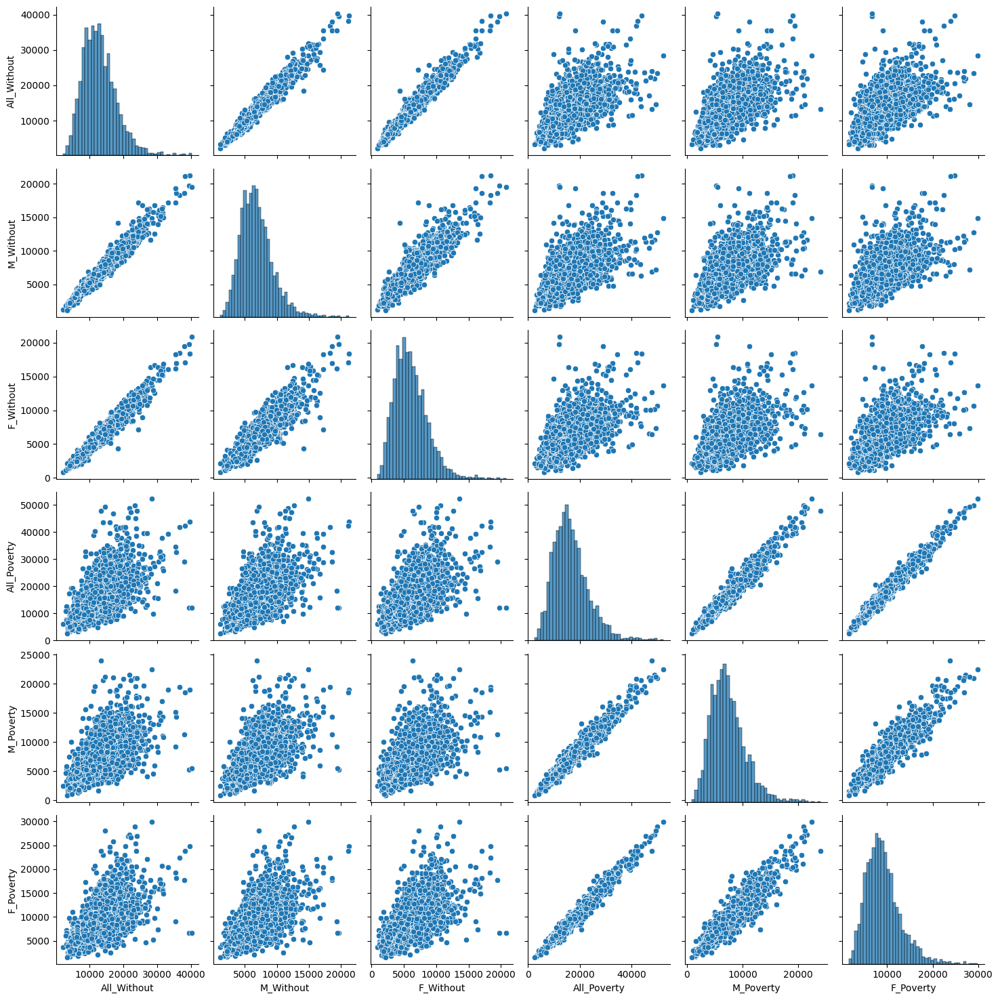

In [973]:
without_health_with_poverty  = fulldf[['All_Without','M_Without','F_Without','All_Poverty','M_Poverty','F_Poverty']]
sns.pairplot(without_health_with_poverty)

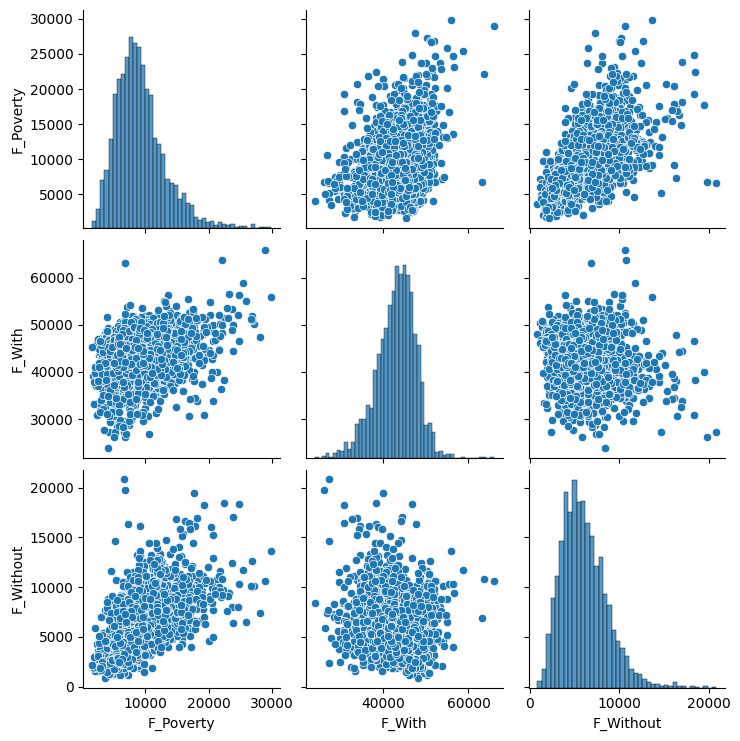

In [974]:
female = fulldf[['F_Poverty', 'F_With', 'F_Without']]
sns.pairplot(female)

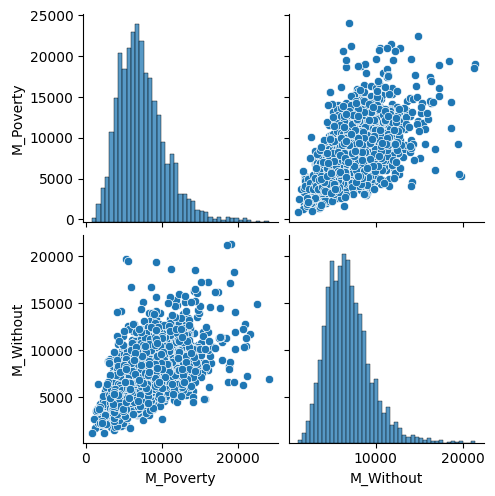

In [975]:
male = fulldf[['M_Poverty', 'M_Without']]
sns.pairplot(male)

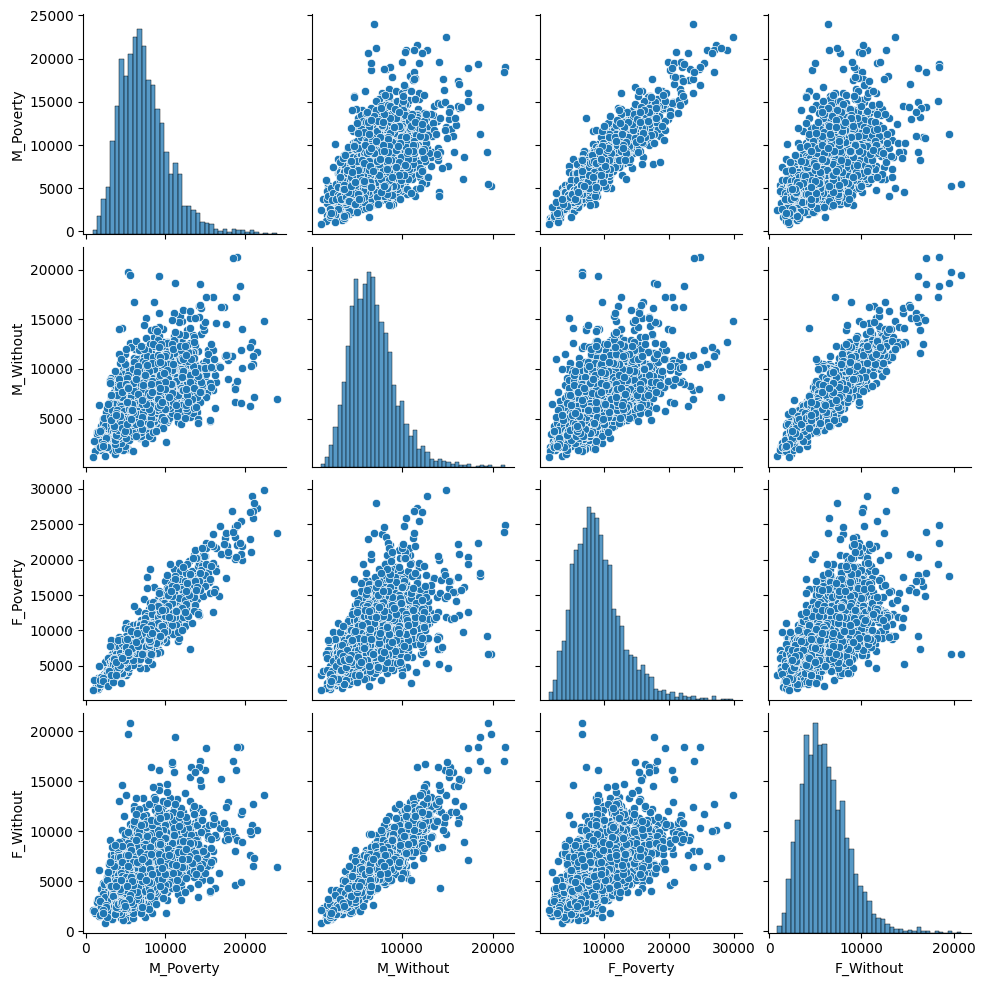

In [976]:
gender = fulldf[['M_Poverty', 'M_Without', 'F_Poverty', 'F_Without']]
sns.pairplot(gender)

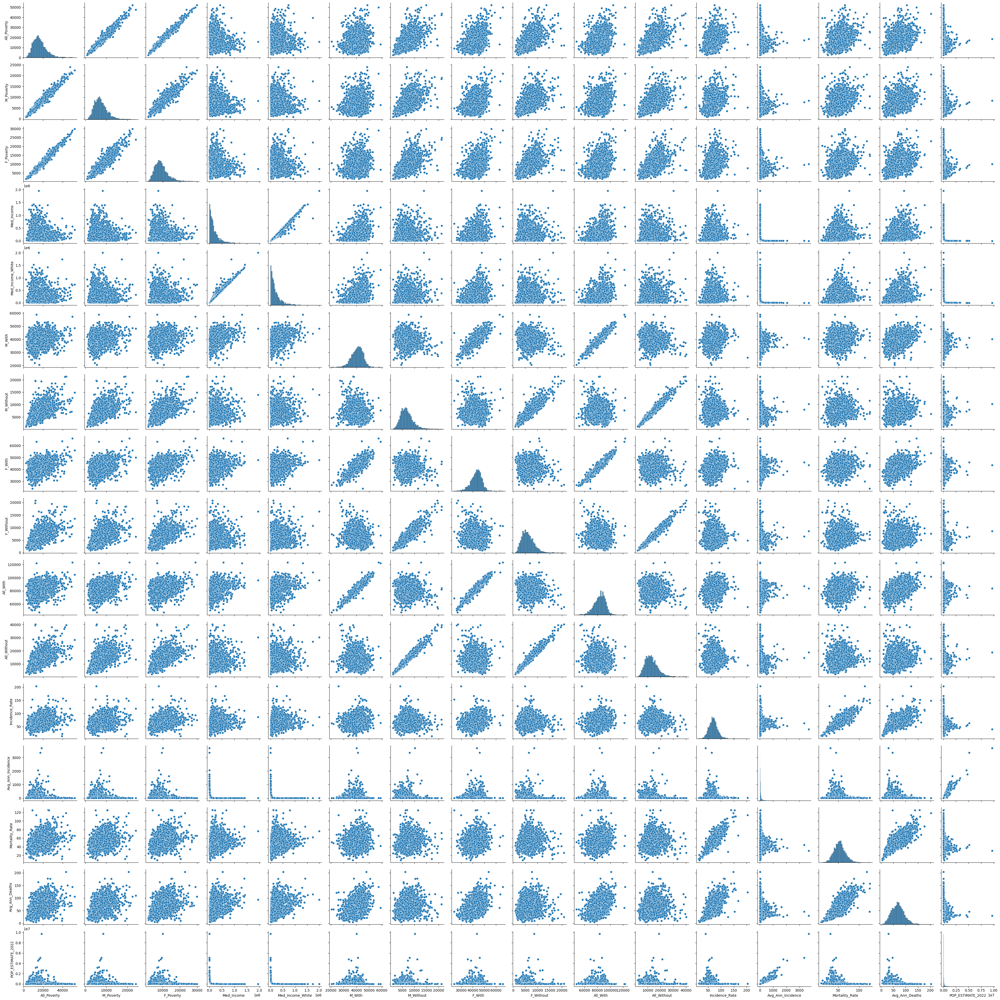

In [977]:
sns.pairplot(fulldf)

### 2.2 Selecting the most important features [10 Marks]
In this step, we want to remove the redundant features.

*Hint*: This can be done by analyzing the correlation between the features and removing the highly correlated features. Remember, throughout the project, write down specific reasons for any desicion you make.

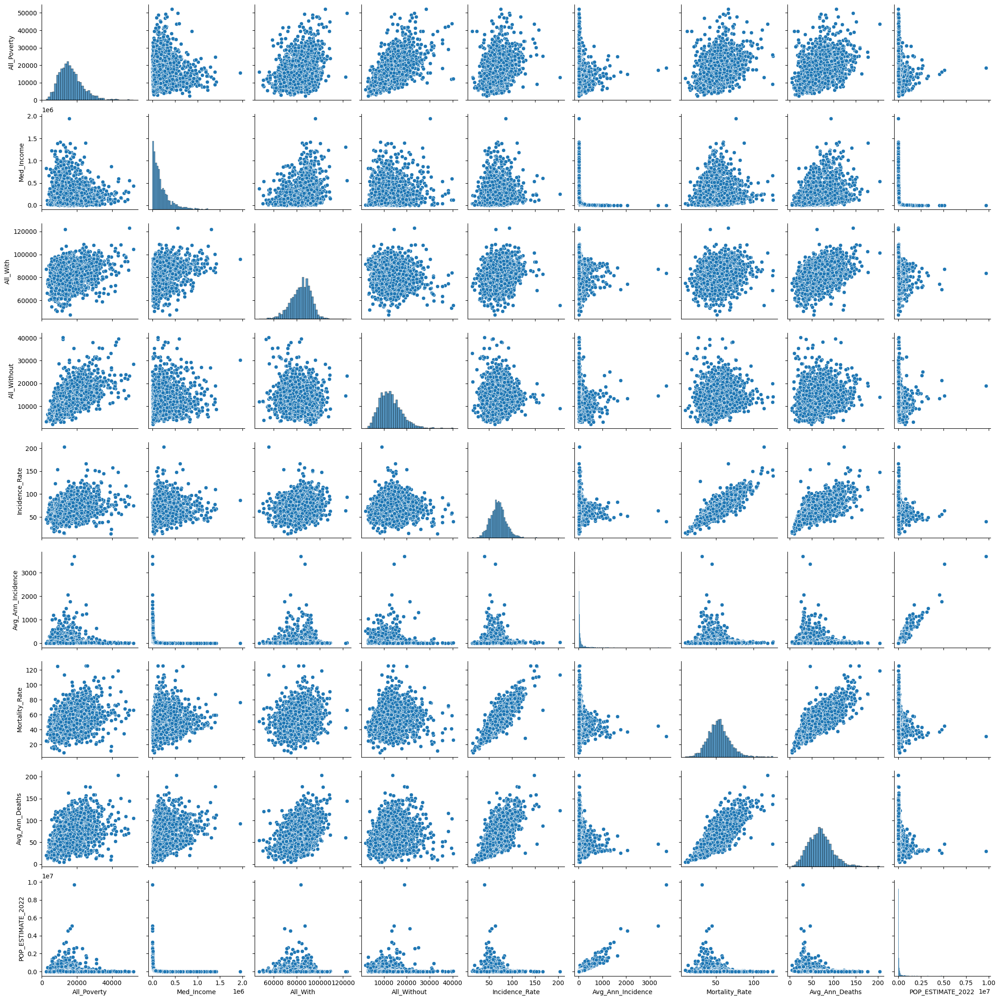

In [978]:
'''
'All_Poverty', 'M_Poverty', 'F_Poverty'
'Med_Income', 'Med_Income_White'
'M_With', 'F_With', 'All_With'
'M_Without', 'F_Without', and 'All_Without' have a strong correlation.
Additionally, while All, Female, and Male all have a strong correlation, there is no meaning in separating Female and Male.
To reduce the number of features, only All were deleted.
'''

fulldf.drop(columns=['M_Poverty','F_Poverty', 'Med_Income_White', 'M_Without', 'F_Without','M_With', 'F_With'], inplace=True)
sns.pairplot(fulldf)

In [979]:
fulldf

,State,AreaName,All_Poverty,FIPS,Med_Income,All_With,All_Without,Incidence_Rate,Avg_Ann_Incidence,Recent_Trend,Mortality_Rate,Avg_Ann_Deaths,POP_ESTIMATE_2022
2,AK,"Anchorage Municipality, Alaska",8328.20,02020,27277.51,84686.48,15545.46,61.5,131.0,stable,47.3,33.43,287145
3,AK,"Bethel Census Area, Alaska",23903.16,02050,279410.64,71331.54,24549.49,62.7,6.0,stable,58.3,27.39,18257
7,AK,"Fairbanks North Star Borough, Alaska",8129.54,02090,74529.13,84750.83,12877.01,58.1,36.0,stable,54.0,32.51,95356
9,AK,"Juneau City and Borough, Alaska",6659.30,02110,270620.17,86226.92,14663.09,35.1,9.0,stable,34.4,25.25,31685
10,AK,"Kenai Peninsula Borough, Alaska",9158.02,02122,104933.27,72596.80,19555.12,64.9,39.0,stable,50.1,46.14,60690
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3120,WY,"Sweetwater County, Wyoming",12233.64,56037,166941.59,93097.11,14514.45,39.9,14.0,stable,28.4,21.77,41345
3121,WY,"Teton County, Wyoming",7033.97,56039,323463.74,79456.35,16103.41,23.7,5.0,stable,29.1,21.47,23287
3122,WY,"Uinta County, Wyoming",13736.00,56041,273121.86,86148.13,14078.79,31.7,6.0,stable,22.1,19.31,20712
3123,WY,"Washakie County, Wyoming",14729.89,56043,617333.85,88599.56,18059.33,50.0,6.0,stable,38.2,64.78,7719


## **Part 3: Regression Model Construction [30 Marks]**

### 3.1 Splitting the dataset [5 Marks]

Split the dataset to three parts: train, validation, and test. You choose the ratios for the three datasets and provide a one-sentence rationale on why you went with such ratios.

*Hint*: You can use the validation set approach from ch5 lab (google colab).

In [1153]:
'''
Since the size of the data was not large, 
I wanted to increase the train data as much as possible, 
and I thought it would be difficult to check overfitting if the validation data and test data were small, 
so I set it like this.
'''
from sklearn.model_selection import train_test_split

fulldf_dropped = fulldf.drop(columns=['State', 'AreaName','FIPS','Recent_Trend'])

# 데이터셋을 훈련, 검증, 테스트 세트로 나누는 비율 설정
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# 훈련과 나머지를 임시로 나누기
train_data, temp_data = train_test_split(fulldf_dropped, test_size=(1 - train_ratio), random_state=42)

# 검증과 테스트로 임시 데이터 나누기
relative_ratio = val_ratio / (val_ratio + test_ratio)
val_data, test_data = train_test_split(temp_data, test_size=relative_ratio, random_state=42)

X_train, y_train = train_data.drop(columns=['Mortality_Rate']), train_data['Mortality_Rate']
X_val, y_val = val_data.drop(columns=['Mortality_Rate']), val_data['Mortality_Rate']
X_test, y_test = test_data.drop(columns=['Mortality_Rate']), test_data['Mortality_Rate']


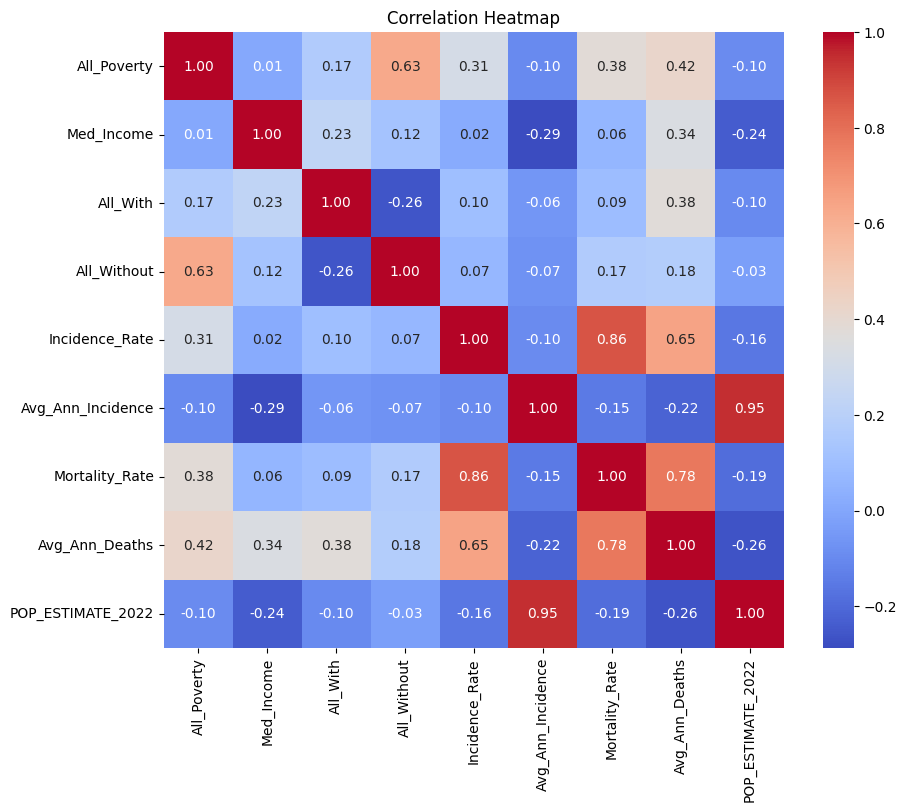

In [1154]:
selected_df = train_data

# 상관 계수 계산
correlation_matrix = selected_df.corr()

# Mortality_Rate와의 상관 계수 가져오기
mortality_rate_correlation = correlation_matrix['Mortality_Rate']

# 히트맵 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Heatmap')
plt.show()

### 3.2 Model training [15 Marks]
Create three different models, using different features (and optionally nonlinear transformations). The purpose of these models is to predict mortality rate of lung cancer with reasonably high R2 (at least exceeding 70%) using a carefully chosen and justified set of features. Use the visualizations from section 2.1 to inform the feature selection for each model.

*Hint:* The purpose here is to create general linear models using a selection of different features, interaction terms, and nonlinear transformation of the predictors. Chapter 3 lab could assist you creating the models.

In [1155]:
from ISLP.models import (ModelSpec as MS,
                         summarize,
                         poly)
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

In [1156]:
print(X_train.columns.values)

['All_Poverty' 'Med_Income' 'All_With' 'All_Without' 'Incidence_Rate'
 'Avg_Ann_Incidence' 'Avg_Ann_Deaths' 'POP_ESTIMATE_2022']


In [1157]:
col1 = ['Incidence_Rate','Avg_Ann_Deaths']
X1_train, y1_train = X_train[col1], y_train
X1_val, y1_val = X_val[col1], y_val
X1_test, y1_test = X_test[col1], y_test

model1 = sm.OLS(y1_train, X1_train)
result1 = model1.fit()
summarize(result1) 


/Users/seonghak/anaconda3/envs/mie1626/lib/python3.10/site-packages/ISLP/models/__init__.py:49: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  results_table = pd.read_html(tab.as_html(),


,coef,std err,t,P>|t|
Incidence_Rate,0.5582,0.007,77.983,0.0
Avg_Ann_Deaths,0.2052,0.007,29.178,0.0


In [1158]:
col2 = ['Med_Income','Incidence_Rate','Avg_Ann_Deaths']
X2_train, y2_train = X_train[col2], y_train
X2_val, y2_val =  X_val[col2], y_val
X2_test, y2_test = X_test[col2], y_test

model2 = sm.OLS(y2_train, X2_train)
result2 = model2.fit()
summarize(result2)

/Users/seonghak/anaconda3/envs/mie1626/lib/python3.10/site-packages/ISLP/models/__init__.py:49: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  results_table = pd.read_html(tab.as_html(),


,coef,std err,t,P>|t|
Med_Income,-0.000004,6.760000e-07,-6.394,0.0
Incidence_Rate,0.549800,7.000000e-03,76.337,0.0
Avg_Ann_Deaths,0.226000,8.000000e-03,29.424,0.0


In [1159]:
col3 = ['Avg_Ann_Deaths', 'Med_Income']
X3_train, y3_train = X_train[col3], y_train
X3_val, y3_val =  X_val[col3], y_val
X3_test, y3_test = X_test[col3], y_test

model3 = sm.OLS(y3_train, X3_train)
result3 = model3.fit()
summarize(result3)

/Users/seonghak/anaconda3/envs/mie1626/lib/python3.10/site-packages/ISLP/models/__init__.py:49: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  results_table = pd.read_html(tab.as_html(),


,coef,std err,t,P>|t|
Avg_Ann_Deaths,0.774400,0.006000,139.529,0.0
Med_Income,-0.000014,0.000001,-10.120,0.0


In [1160]:
col4 = ['Incidence_Rate', 'Avg_Ann_Incidence', 'All_Poverty', 'All_Without', 'POP_ESTIMATE_2022']
X4_train, y4_train = X_train[col4], y_train
X4_val, y4_val =  X_val[col4], y_val
X4_test, y4_test = X_test[col4], y_test

model4 = sm.OLS(y4_train, X4_train)
result4 = model4.fit()
summarize(result4)

/Users/seonghak/anaconda3/envs/mie1626/lib/python3.10/site-packages/ISLP/models/__init__.py:49: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  results_table = pd.read_html(tab.as_html(),


,coef,std err,t,P>|t|
Incidence_Rate,6.887000e-01,0.006000,109.812,0.000
Avg_Ann_Incidence,-4.400000e-03,0.003000,-1.695,0.090
All_Poverty,1.000000e-04,0.000032,4.331,0.000
All_Without,2.000000e-04,0.000038,6.388,0.000
POP_ESTIMATE_2022,4.737000e-07,0.000001,0.365,0.715


### 3.3 Model selection [10 Marks]
Using different model selection criteria and validation dataset, choose the single best perfoming model among the three models.

In [1161]:
'''
When the mse errors of the four models were output, 
the second model performed best. We will select the second model and proceed below.
'''

train_set = [X1_train, X2_train, X3_train, X4_train]
val_set = [X1_val, X2_val, X3_val, X4_val]
test_set = [X1_test, X2_test, X3_test, X4_test]
models = [result1, result2, result3, result4]
y_val = [y1_val, y2_val, y3_val, y4_val]

In [1162]:
prediction = []

for i, model in enumerate(models):
    pred = model.get_prediction(val_set[i])
    prediction.append(pred.predicted_mean.mean())
    print('model[{}] prediction : {}'.format(i, pred.predicted_mean.mean()))   
    

model[0] prediction : 52.46910934650387
model[1] prediction : 52.42008246391883
model[2] prediction : 49.595293223764195
model[3] prediction : 52.798834071773136


In [1165]:
from sklearn.metrics import mean_squared_error

pred = []
mse = []

for i, model in enumerate(models):
    pred.append(model.predict(val_set[i]))
    mse.append(mean_squared_error(y_val[i], pred[-1]))
    print('model[{i}] mse : {mse}'.format(i=i, mse=mse[i]))



model[0] mse : 33.08111314280851
model[1] mse : 31.509635453966045
model[2] mse : 137.6988270855014
model[3] mse : 48.03345346322519


## **Part 4: Model diagnostics [10 marks]**
### 4.1 Multicollinearity [5 marks]

Explore model collinearity with `variance_inflation_factor`. Larger values of VIF indicate multicollinearity. Remove the problematic features and refit the model. Report how model R-squared is affected.

*Hint:* Consider VIF > 10 as an indicator of multicollinearity. If the VIF for all your features is below 10, it is a positive indication that the level of collinearity is acceptably low without any changes to the model needed in this step.

In [1115]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

for idx, model in enumerate(models):
    vif = pd.DataFrame()
    vif["Features"] = train_set[idx].columns
    vif["VIF Factor"] = [variance_inflation_factor(train_set[idx].values, i) for i in range(train_set[idx].shape[1])]
    print(vif)
    print('-----------------------------------')

         Features  VIF Factor
0  Incidence_Rate   13.902734
1  Avg_Ann_Deaths   13.902734
-----------------------------------
         Features  VIF Factor
0      Med_Income    2.196208
1  Incidence_Rate   14.380673
2  Avg_Ann_Deaths   16.943874
-----------------------------------
         Features  VIF Factor
0  Avg_Ann_Deaths    2.123218
1      Med_Income    2.123218
-----------------------------------
            Features  VIF Factor
0     Incidence_Rate    8.078063
1  Avg_Ann_Incidence   11.492898
2        All_Poverty   12.848229
3        All_Without   11.048179
4  POP_ESTIMATE_2022   10.934156
-----------------------------------


In [1109]:
'''
Columns with a vif exceeding 10 in X2 were removed and then learned again to measure mse.
Since the Mse and r2 scores were worse when the column was dropped, 
it is believed that not dropping the column is a model that performs better. 
So, I chose a model that did not drop.
'''
X2_train_dropped = train_set[1].drop(columns=['Incidence_Rate','Avg_Ann_Deaths'])
X2_val_dropped = val_set[1].drop(columns=['Incidence_Rate','Avg_Ann_Deaths'])
X2_test_dropped = test_set[1].drop(columns=['Incidence_Rate','Avg_Ann_Deaths'])

model2_dropped = sm.OLS(y2_train, X2_train_dropped)
result2_dropped = model2_dropped.fit()
summarize(result2_dropped)

y_pred_dropped = result2_dropped.predict(X2_test_dropped)
mse = mean_squared_error(y2_test, y_pred_dropped)
print('mse error : {}'.format(mse))

mse error : 1695.1659058453067


/Users/seonghak/anaconda3/envs/mie1626/lib/python3.10/site-packages/ISLP/models/__init__.py:49: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  results_table = pd.read_html(tab.as_html(),


In [1110]:
from sklearn.metrics import r2_score

r2 = r2_score(y_test, y_pred_dropped)
print("R2 Score:", r2)

r2 = r2_score(y_test, pred[1])
print("R2 Score before drop columns : {}".format(r2))

R2 Score: -7.145953181110407
R2 Score before drop columns : 0.8633114262258952


### 4.2 Heteroscedasticity [5 marks]
Explore model heteroscedasticity with `het_breuschpagan`. Interpret the results. State if homoscedasticity or heteroscedasticity is an important assumption in ordinary least squares.

*Hint:* Here, there is no need to recalibrate the model.

In [1170]:
'''
Lagrange multiplier statistic (test statistic): 201.94

The Lagrange multiplier statistic is a test statistic for testing multicollinearity. The larger this value, the more likely multicollinearity occurs.
p-value (test significance probability): 1.6045016719601791e-43 (almost close to 0)

The p-value indicates how statistically significant the test statistic is. Here the p-value is very small, so there is enough evidence to reject the null hypothesis. In other words, it is determined that multicollinearity exists.
F-value (F-statistic): 75.44

The F-statistic is an additional statistic in the test to check for multicollinearity. The larger the value of this statistic, the more likely multicollinearity occurs.
f p-value (p-value of F-statistic): 5.133147276790676e-46 (close to 0)

f p-value indicates the statistical significance of the F-statistic. Here too, the p-value is very small, so the F-statistic is judged to be statistically significant.

'''

from statsmodels.stats.diagnostic import het_breuschpagan

model = models[1]
bp_test = het_breuschpagan(model.resid, sm.add_constant(model.model.exog))

print('Lagrange multiplier statistic:', bp_test[0])
print('p-value:', bp_test[1])
print('f-value:', bp_test[2])
print('f p-value:', bp_test[3])

Lagrange multiplier statistic: 201.9429252079536
p-value: 1.6045016719601791e-43
f-value: 75.43865438936673
f p-value: 5.133147276790676e-46


## **Part 5: Reporting model performance [10 marks]**


### 5.1 Model test performance [5 Marks]
Report the MSE of the final regression model using the test set.

In [1171]:

pred = model.predict(test_set[1])
mse = mean_squared_error(y2_test, pred)
print('mse : {}'.format(mse))



mse : 28.444775562643024


### 5.2 Confidence interval for validation MSE [5 Marks]
Using bootstraping on the training + validation data, find the 95% confidence intervals on mean squared error.

*Hint:* Refer to ch5 lab on the matter.

In [1237]:
import numpy as np
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

# Bootstrap function
def bootstrap_mse(X, y, model, n_bootstrap=1000, test_size=0.2):
    mse_scores = []
    n_samples = len(X)
    n_test = int(n_samples * test_size)
    
    for _ in range(n_bootstrap):
        # Bootstrap sampling
        indices = np.random.choice(n_samples, size=n_samples, replace=True)
        X_bootstrap = X.iloc[indices]
        y_bootstrap = y.iloc[indices]
        
        # model training and prediction
        model1 = model(y_bootstrap, X_bootstrap).fit()
        # result = model1.fit()
        y_pred = model1.predict(X_bootstrap)
        
        # MSE
        mse = mean_squared_error(y_bootstrap, y_pred)
        mse_scores.append(mse)
    
    # 95% confidnece interval 
    lower_bound = np.percentile(mse_scores, 2.5)
    upper_bound = np.percentile(mse_scores, 97.5)
    
    return np.mean(mse_scores), (lower_bound, upper_bound)

X_train_val = pd.concat([train_set[1],val_set[1]], axis=0)
y_train_val = pd.concat([y2_train, y2_val], axis=0)
# bootstrapping MSE 
mean_mse, ci_mse = bootstrap_mse(X_train_val, y_train_val, sm.OLS, n_bootstrap=1000)

# result
print("Mean MSE:", mean_mse)
print("95% Confidence Interval on MSE:", ci_mse)

Mean MSE: 34.37372025137277
95% Confidence Interval on MSE: (30.815349289742766, 38.40360465436576)


## **Part 6: Alternative predictive model: [15 marks plus additional 5 bonus marks up to the maximum mark]**

Use one other supervised learning model to outperform the selected regression model from part 5 (in terms of MSE) on the same hold-out test set. Document, justify, and explain all your decision w.r.t. the implementation of this alternative predictive model.

This part is deliberately designed without detailed instructions for encouraging independent skills for completing a very common statistical learning task without a walkthrough or instrcutions.

In [ ]:
'''
When I experimented with various linear models (LinearRegression, Ridge, Lasso), 
they were all similar, but all had low mse compared to the OLS model.
I wanted to use the linear model I learned in class a lot, so I tried using several models.
I also measured mse using an ensemble model, 
and we can see that the performance was higher than using linear models.
'''

In [1249]:
# Bootstrap function
def bootstrap_mse(X, y, model, n_bootstrap=1, test_size=0.2):
    mse_scores = []
    n_samples = len(X)
    n_test = int(n_samples * test_size)
    
    for _ in range(n_bootstrap):
        # Bootstrap sampling
        indices = np.random.choice(n_samples, size=n_samples, replace=True)
        X_bootstrap = X.iloc[indices]
        y_bootstrap = y.iloc[indices]
        
        # model training and prediction
        model1 = model.fit(X_bootstrap,y_bootstrap)
        # result = model1.fit()
        y_pred = model1.predict(X_bootstrap)
        
        # MSE
        mse = mean_squared_error(y_bootstrap, y_pred)
        mse_scores.append(mse)
    
    # 95% confidnece interval 
    lower_bound = np.percentile(mse_scores, 2.5)
    upper_bound = np.percentile(mse_scores, 97.5)
    
    return np.mean(mse_scores), (lower_bound, upper_bound)

In [1252]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso

# 선형 회귀 모델 객체 생성
linear = LinearRegression()
ridge = Ridge(alpha=1.0)
lasso = Lasso(alpha=1.0)

model = [linear, ridge, lasso]
X_train_val = pd.concat([train_set[1],val_set[1]], axis=0)
y_train_val = pd.concat([y2_train, y2_val], axis=0)

for i, model in enumerate(model):
    
    mean_mse, ci_mse = bootstrap_mse(X_train_val, y_train_val, model, n_bootstrap=1000)

    # result
    print('model : {}'.format(model))
    print("Mean MSE:", mean_mse)
    print("95% Confidence Interval on MSE:", ci_mse)
    print('-----------------------------------------------------------------------------------')




model : LinearRegression()
Mean MSE: 32.39829039431928
95% Confidence Interval on MSE: (29.12560480084106, 35.813079332130926)
-----------------------------------------------------------------------------------
model : Ridge()
Mean MSE: 32.38030174541946
95% Confidence Interval on MSE: (29.182830835049238, 35.82106482182811)
-----------------------------------------------------------------------------------
model : Lasso()
Mean MSE: 32.407266081938204
95% Confidence Interval on MSE: (29.27289014772277, 36.01738287242503)
-----------------------------------------------------------------------------------


In [1250]:
from sklearn.ensemble import GradientBoostingRegressor

# 선형 회귀 모델 객체 생성
linear = GradientBoostingRegressor()

model = [linear]
X_train_val = pd.concat([train_set[1],val_set[1]], axis=0)
y_train_val = pd.concat([y2_train, y2_val], axis=0)

for i, model in enumerate(model):
    
    mean_mse, ci_mse = bootstrap_mse(X_train_val, y_train_val, model, n_bootstrap=1)

    # result
    print('model : {}'.format(model))
    print("Mean MSE:", mean_mse)
    print("95% Confidence Interval on MSE:", ci_mse)
    print('-----------------------------------------------------------------------------------')




model : GradientBoostingRegressor()
Mean MSE: 18.87757254354163
95% Confidence Interval on MSE: (18.87757254354163, 18.87757254354163)
-----------------------------------------------------------------------------------
